In [51]:
# to do: 
# set up structure for process of data exploration - should we do this outside of the notebook? or right after lecture together? 
# figure out markdown 
# turn off type hints? how to set up chat 

# SWDB Day 1: Data and Tools Overview 

This tutorial provides suggested scaffolding for exploring a new dataset, including basic data access patterns and visualizations to build understanding. Along the way, we'll fill out a README documenting findings in the form of text descriptions, code snippets, and figures. 

## Learning objectives: 
    - Navigate the structure and organization of an Neurodata Without Borders (NWB) file ('pynwb') 
    - Select, align, and summarize neural and behavioral data ('numpy', 'pandas')
    - Build visualizations to develop intuition about the data and perform sanity checks ('matplotlib') 

# Process 

Starting from a scientfic question, the process is as follows: 
1. Write down expectations of what data is available and needed for your question (e.g. neural activity, behavior data, stimulus information)

2. Explore the data structure and organization

3. Load data pieces and inspect 

4. Create visualizations along the way, building in complexity 

Along the way, document important information about the project, such as.... 


# Tutorial 

We'll work through this process for two example datasets (an optical physiology and electrophysiology example). 

To do - say something about other datasets that we aren't covering, what are similarities? note that they have idiosyncracies, so pay attention to the process, not necessarily the exact syntax. 

# V1 Deep Dive 

To do - add context about V1 DD dataset. keep it brief as we want to encourage exploration of the dataset to uncover information. 

In [52]:
import pynwb 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

In [53]:
# First, explore the /data folder organization.
os.listdir('/data')

# in the end, there will be a folder for each project dataset (combined data asset) and a metadata folder. 
# for V1DD, folder for each subject ('subject_V1DD_Filtered')

['ecephys_742903_2024-10-22_10-58-35_nwb_2026-05-18_22-02-14',
 'ecephys_713655_2024-08-09_10-41-47_nwb_2026-05-18_21-59-59',
 'ecephys_759434_2025-02-04_12-27-22_nwb_2026-05-18_21-56-27',
 'ecephys_668755_2023-08-31_12-33-31_nwb_2026-05-18_21-59-03',
 'ecephys_664851_2023-11-15_12-38-21_nwb_2026-05-18_21-58-33',
 '438833_V1DD_Filtered',
 '416296_V1DD_Filtered',
 'brain-computer-interface-v2',
 'Neuropixels_Opto_ecephys_nwb_combined',
 '409828_V1DD_Filtered',
 'metadata']

In [54]:
os.listdir('/data/409828_V1DD_Filtered')

# within a subject folder, there will be a folder for each session (e.g. subject_session_filtered_processingdate)
# question - is there documentation for naming shemes we can point to? 

['409828_2018-11-06_14-02-59_filtered_2026-04-09_04-59-00',
 '409828_2018-11-20_10-42-45_filtered_2026-04-09_04-58-44',
 '409828_2018-11-20_12-12-08_filtered_2026-05-15_00-15-57',
 '409828_2018-11-21_09-22-23_filtered_2026-04-16_02-51-11',
 '409828_2018-11-21_10-56-07_filtered_2026-04-09_05-50-02',
 '409828_2018-11-26_11-16-25_filtered_2026-04-09_05-50-03',
 '409828_2018-11-27_11-01-58_filtered_2026-04-09_05-50-34',
 '409828_2018-11-27_12-29-05_filtered_2026-04-09_05-50-36',
 '409828_2018-11-28_10-54-56_filtered_2026-04-16_09-56-00',
 '409828_2018-11-29_13-42-04_filtered_2026-04-09_05-50-33',
 '409828_2018-12-03_14-25-24_filtered_2026-04-09_05-50-36',
 '409828_2018-12-03_15-56-23_filtered_2026-04-09_05-54-06',
 '409828_2018-12-04_15-27-53_filtered_2026-04-09_05-57-20',
 '409828_2018-12-05_14-40-32_filtered_2026-04-09_05-50-22',
 '409828_2018-12-07_15-05-38_filtered_2026-04-09_05-50-47',
 '409828_2018-12-10_14-02-21_filtered_2026-04-09_05-54-42',
 '409828_2018-12-10_15-28-55_filtered_20

In [55]:
os.listdir('/data/409828_V1DD_Filtered/409828_2018-11-06_14-02-59_filtered_2026-04-09_04-59-00')
# within each session folder, there will be a folder for each session NWB file (e.g. subject_session.nwb.zarr) as well as metadata json files 
# the data is in nwb.zarr format, which is a zarr-based storage format for NWB. allows for efficient cloud storage and streaming. 

['subject.json',
 'data_description.json',
 'output',
 'processing.json',
 'acquisition.json',
 'original_metadata',
 '409828_2018-11-06_14-02-59.nwb.zarr',
 'metadata.nd.json',
 'instrument.json',
 'procedures.json']

# Exercise: 

Document the data organization in V1DD_README.md. 

In [56]:
# Metadata 

# Each project dataset has a metadata csv file in the /data/metadata folder. This file is pre-generated from the metadata database and contains information about each session. 

os.listdir('/data/metadata')

['V1DD_metadata.csv']

In [57]:
# Load metadata CSV as a pandas dataframe. 
# Each row corresponds to a session and each column contains different metadata fields. 

metadata = pd.read_csv('/data/metadata/V1DD_metadata.csv', index_col = False) 
metadata

,project_name,_id,name,subject_id,golden_mouse,genotype,date_of_birth,sex,modality,session_date,age,session_time,column,volume
0,V1 Deep Dive,3b85c659-20c8-438f-ab58-de1aac3b81cf,416296_2018-11-29_12-08-40_nwb_2025-08-08_16-2...,416296,False,Camk2a-tTA/wt;tetO-GCaMP6s/wt,2018-08-06,Female,"['Planar optical physiology', 'Behavior videos']",2018-11-29,115,12:08:40.014190,2,5
1,V1 Deep Dive,b98ce4a9-a66b-4b70-baa6-95ef451ae087,427836_2019-04-25_12-16-58_nwb_2025-08-08_16-2...,427836,False,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,2018-10-08,Female,"['Planar optical physiology', 'Behavior videos']",2019-04-25,199,12:16:58.240890,5,3
2,V1 Deep Dive,5cccd09c-4ae8-4d8e-ae92-23099d22bbe2,427836_2019-04-24_13-06-45_nwb_2025-08-08_16-2...,427836,False,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,2018-10-08,Female,"['Planar optical physiology', 'Behavior videos']",2019-04-24,198,13:06:45.257460,4,3
3,V1 Deep Dive,911d215f-dafa-4b39-86f7-b36336974da1,427836_2019-04-25_13-49-39_nwb_2025-08-08_16-2...,427836,False,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,2018-10-08,Female,"['Planar optical physiology', 'Behavior videos']",2019-04-25,199,13:49:39.163550,5,4
4,V1 Deep Dive,c918f874-d534-4341-b0dc-f1aba388af66,427836_2019-04-26_12-54-40_nwb_2025-08-08_16-2...,427836,False,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,2018-10-08,Female,"['Planar optical physiology', 'Behavior videos']",2019-04-26,200,12:54:40.332660,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,V1 Deep Dive,52b95969-9c9d-4eab-bbec-8e4c5a0f078d,416296_2018-12-04_13-45-25_nwb_2025-08-08_16-2...,416296,False,Camk2a-tTA/wt;tetO-GCaMP6s/wt,2018-08-06,Female,"['Planar optical physiology', 'Behavior videos']",2018-12-04,120,13:45:25.427340,5,3
96,V1 Deep Dive,08164a2c-f0e6-4e48-853d-7fcda83dafab,416296_2018-12-05_11-31-44_nwb_2025-08-08_16-2...,416296,False,Camk2a-tTA/wt;tetO-GCaMP6s/wt,2018-08-06,Female,"['Planar optical physiology', 'Behavior videos']",2018-12-05,121,11:31:44.290780,5,4
97,V1 Deep Dive,1f103471-2fc0-4423-b77f-989d43ee3be6,416296_2018-12-07_13-19-39_nwb_2025-08-08_16-2...,416296,False,Camk2a-tTA/wt;tetO-GCaMP6s/wt,2018-08-06,Female,"['Planar optical physiology', 'Behavior videos']",2018-12-07,123,13:19:39.881600,4,5
98,V1 Deep Dive,392c2437-babc-4aec-b13c-11b5f449d799,416296_2018-11-30_13-10-57_nwb_2025-08-08_16-2...,416296,False,Camk2a-tTA/wt;tetO-GCaMP6s/wt,2018-08-06,Female,"['Planar optical physiology', 'Behavior videos']",2018-11-30,116,13:10:57.408410,3,5


In [58]:
# What metadata is available? 
metadata.columns

# to do: add further resources for metadata exploration. should we call out mcp server? 

Index(['project_name', '_id', 'name', 'subject_id', 'golden_mouse', 'genotype',
       'date_of_birth', 'sex', 'modality', 'session_date', 'age',
       'session_time', 'column', 'volume'],
      dtype='object')

In [59]:
# How many sessions are available? 
metadata.shape

(100, 14)

In [60]:
# What are the data modalities? 
metadata.modality.unique()

# Questions - are behavior videos available with the NWB file? 

array(["['Planar optical physiology', 'Behavior videos']"], dtype=object)

In [61]:
# How many subjects in the dataset? 
metadata.subject_id.nunique()

4

In [62]:
# Number of sessions per subject 
metadata.subject_id.value_counts()

subject_id
416296    25
427836    25
438833    25
409828    25
Name: count, dtype: int64

In [63]:
# What do the 'column' and 'volume' columns represent? 

metadata[['column', 'volume']].value_counts()

# for each subject, a volume within a structural column in V1 was imaged 

column  volume
1       1         4
        2         4
        3         4
        4         4
        5         4
2       1         4
        2         4
        3         4
        4         4
        5         4
3       1         4
        2         4
        3         4
        4         4
        5         4
4       1         4
        2         4
        3         4
        4         4
        5         4
5       1         4
        2         4
        3         4
        4         4
        5         4
Name: count, dtype: int64

In [64]:
# What are unique genotypes in the dataset? 
metadata.genotype.unique() 
# or use 
# set(metadata.genotype)

# In plain language, what are the genotypes? Refer to the data book documentation  

array(['Camk2a-tTA/wt;tetO-GCaMP6s/wt',
       'Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-GCaMP6s)/wt'],
      dtype=object)

In [65]:
# Exercise: 

# Update the README with the useful information we've learned about the dataset (e.g. number of sessions, subjects, genotypes, vocabulary)

In [66]:
# Exercise: 

# Come up with another metadata exploration question and write the code to answer it. 

# Open a session NWB file 

### Neurodata Without Borders (NWB) files

to do: write something about NWB files as a standard for neurophysiology data. 


In [67]:
selected_path = '/root/capsule/data/409828_V1DD_Filtered/409828_2018-11-06_14-02-59_filtered_2026-04-09_04-59-00/409828_2018-11-06_14-02-59.nwb.zarr'
nwb = pynwb.read_nwb(selected_path)

nwb

root pynwb.file.NWBFile at 0x139789124571824
Fields:
  acquisition: {
    vasculature_maps <class 'pynwb.base.Images'>
  }
  devices: {
    DEEPSCOPE <class 'pynwb.device.Device'>
  }
  epochs: epochs <class 'pynwb.epoch.TimeIntervals'>
  experiment_description: 2-photon imaging of column 2, volume 1
  file_create_date: [datetime.datetime(2025, 12, 15, 19, 45, 15, 752494, tzinfo=tzoffset(None, -28800))]
  identifier: 992c7efa-1f27-431d-a5cc-94e8a81aafa8
  imaging_planes: {
    plane-0 <class 'pynwb.ophys.ImagingPlane'>,
    plane-1 <class 'pynwb.ophys.ImagingPlane'>,
    plane-2 <class 'pynwb.ophys.ImagingPlane'>,
    plane-3 <class 'pynwb.ophys.ImagingPlane'>,
    plane-4 <class 'pynwb.ophys.ImagingPlane'>,
    plane-5 <class 'pynwb.ophys.ImagingPlane'>
  }
  institution: Allen Institute
  intervals: {
    epochs <class 'pynwb.epoch.TimeIntervals'>,
    stimulus_table <class 'pynwb.epoch.TimeIntervals'>
  }
  keywords: <zarr.core.Array '/general/keywords' (4,) object read-only>
  processing: {
    behavior <class 'pynwb.base.ProcessingModule'>,
    plane-0 <class 'pynwb.base.ProcessingModule'>,
    plane-1 <class 'pynwb.base.ProcessingModule'>,
    plane-2 <class 'pynwb.base.ProcessingModule'>,
    plane-3 <class 'pynwb.base.ProcessingModule'>,
    plane-4 <class 'pynwb.base.ProcessingModule'>,
    plane-5 <class 'pynwb.base.ProcessingModule'>
  }
  session_description: V1 Deep Dive, Golden Mouse
  session_id: 774328450
  session_start_time: 2018-11-06 14:02:59-08:00
  stimulus: {
    locally_sparse_noise <class 'pynwb.base.Images'>,
    natural_images <class 'pynwb.base.Images'>,
    natural_movie <class 'pynwb.base.Images'>
  }
  subject: subject pynwb.file.Subject at 0x139789349598464
Fields:
  age: 126
  age__reference: birth
  description: Golden Mouse
  genotype: Slc17a7-IRES2-Cre;Camk2a-tTA;Ai94
  sex: male
  species: Mus musculus
  subject_id: 409828

  timestamps_reference_time: 2018-11-06 14:02:59-08:00

# Explore data structure 

Which containers are the key data pieces stored in?

-Neural activity 

-Stimulus information

-Behavior data 

In [68]:
# Neural activity 

# to do - might change the order to show the images/ROIs first, then dff 

# stored in the processing container of the NWB file

# processing has behavior data and planes - each volume contains 6 planes
# open up data for a single plane. 
# use . to see options

nwb.processing

{'behavior': behavior pynwb.base.ProcessingModule at 0x139789124718032
 Fields:
   data_interfaces: {
     eye_tracking <class 'hdmf.common.table.DynamicTable'>,
     running_speed <class 'pynwb.base.TimeSeries'>
   }
   description: processed behavioral data,
 'plane-0': plane-0 pynwb.base.ProcessingModule at 0x139789240575152
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module,
 'plane-1': plane-1 pynwb.base.ProcessingModule at 0x139789100456976
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module,
 'plane-2': plane-2 pynwb.base.ProcessingModule at 0x139789100456688
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module,
 'plane-3': plane-3 pynwb.base.ProcessingModule at 0x139789124322656
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module,
 'plane-4': plane-4 pynwb.base.ProcessingModule at 0x139789350416608
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module,
 'plane-5': plane-5 pynwb.base.ProcessingModule at 0x139789100462496
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module}

In [69]:
# Neural activity data is stored by plane. (6 planes total). 

nwb.processing['plane-0']

# Say something about what data pieces are available in each plane container 
# Importantly - raw, neuropil, dff, image segmentation, images, events (?) 

# What data do we likely want to work with?  

Data type,float32
Shape,"(22029, 9)"
Array size,774.46 KiB
Data type,float64
Shape,"(22029,)"
Array size,172.10 KiB
Data type,float64
Shape,"(3,)"
Array size,24.00 bytes
Data type,float64
Shape,"(2,)"


In [101]:
# Load the neural activity data (dff) and inspect its structure 

dff = nwb.processing['plane-0']['dff'].data
print(np.shape(dff))

# What does the shape correspond to? 
# frames x rois 
# to do - maybe get frame rate  

(22029, 9)


Text(0.5, 1.0, 'Calcium Activity Trace')

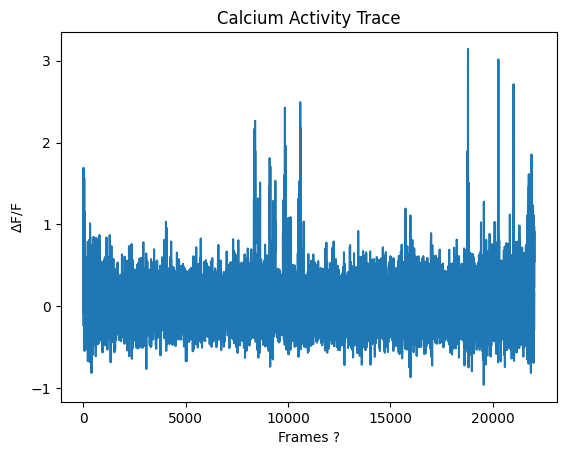

In [71]:
# As a sanity check of the structure of the data, let's plot the dff for a single ROI. 

# Q - how to find the frame rate information? 

ROI = 0 

plt.plot(dff[:, ROI])
plt.ylabel(r'$\Delta$F/F')
plt.xlabel('Frames ?')
plt.title('Calcium Activity Trace')

(22029,)


Text(0.5, 1.0, 'Calcium Activity Trace')

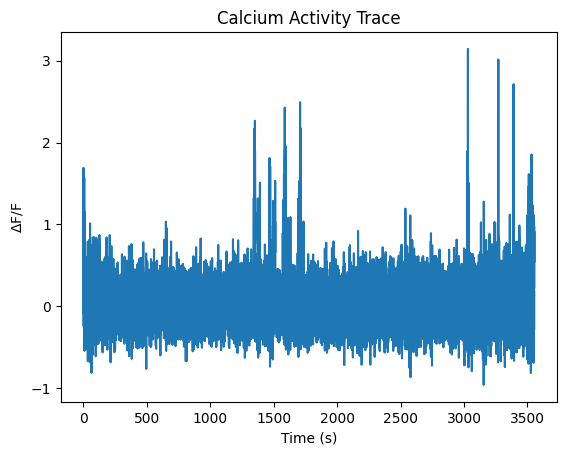

In [72]:
# We have timestamps, if we plot against time, this should roughly match the session duration 
# to do - add session end time to metadata CSVs to get session duration as a sanity check 

# Get timestamps from the NWB file 
ts = nwb.processing['plane-0']['dff'].timestamps[:]
print(np.shape(ts))

# Plot dff for a single ROI against time 
plt.plot(ts, dff[:, ROI])
plt.ylabel(r'$\Delta$F/F')
plt.xlabel('Time (s)')
plt.title('Calcium Activity Trace')

In [ ]:
3500/60

# to do - get session end time into metadata to compare to session duration from timestamps 

# ~1 hour recording session 

58.333333333333336

In [ ]:
# Now let's check the ROIs  

# Within the dff container, there is also a table of ROIs. Let's save the table in our workspace as a pandas dataframe. 
roi_table = nwb.processing['plane-0']['dff'].rois.to_dataframe()
roi_table

# see equivalent number of ROIs as columns in the dff shape 
# assume each column corresponds to each row in this table 

# to call out - ROI index is not continuous, filtered for somas 
# what is pika_roi_id and pika_roi_confidence? 
# pixel mask structure - what is this? masks out the spatial region where the masks are in the image 

,column,volume,plane,roi,pika_roi_id,pika_roi_confidence,is_soma,pixel_mask
id,,,,,,,,
0,2,1,0,0,774393041_0000,0.916531,True,"[[115, 260, 1.0], [112, 261, 1.0], [113, 261, ..."
1,2,1,0,1,774393041_0001,0.916861,True,"[[207, 284, 1.0], [208, 284, 1.0], [209, 284, ..."
2,2,1,0,2,774393041_0002,0.913705,True,"[[247, 97, 1.0], [248, 97, 1.0], [244, 98, 1.0..."
3,2,1,0,4,774393041_0004,0.915848,True,"[[159, 335, 1.0], [160, 335, 1.0], [161, 335, ..."
4,2,1,0,5,774393041_0005,0.912224,True,"[[135, 358, 1.0], [136, 358, 1.0], [137, 358, ..."
5,2,1,0,7,774393041_0007,0.912520,True,"[[390, 463, 1.0], [391, 463, 1.0], [392, 463, ..."
6,2,1,0,9,774393041_0009,0.916683,True,"[[300, 343, 1.0], [301, 343, 1.0], [302, 343, ..."
7,2,1,0,65,774393041_0066,0.912281,True,"[[142, 273, 1.0], [143, 273, 1.0], [144, 273, ..."
8,2,1,0,149,774393041_0151,0.522310,True,"[[344, 448, 1.0], [345, 448, 1.0], [346, 448, ..."


In [ ]:
# Let's inspect the ROI pixel masks and plot them 
print(np.shape(roi_table.pixel_mask[0]))

roi_table.pixel_mask[0]

# Pixel masks are organized into a 3D array with spatial coordinates of the mask (x,y) and the third dimension is the weight 


(186,)


array([(115, 260, 1.), (112, 261, 1.), (113, 261, 1.), (114, 261, 1.),
       (115, 261, 1.), (116, 261, 1.), (117, 261, 1.), (118, 261, 1.),
       (111, 262, 1.), (112, 262, 1.), (113, 262, 1.), (114, 262, 1.),
       (115, 262, 1.), (116, 262, 1.), (117, 262, 1.), (118, 262, 1.),
       (119, 262, 1.), (110, 263, 1.), (111, 263, 1.), (112, 263, 1.),
       (113, 263, 1.), (114, 263, 1.), (115, 263, 1.), (116, 263, 1.),
       (117, 263, 1.), (118, 263, 1.), (119, 263, 1.), (120, 263, 1.),
       (110, 264, 1.), (111, 264, 1.), (112, 264, 1.), (113, 264, 1.),
       (114, 264, 1.), (115, 264, 1.), (116, 264, 1.), (117, 264, 1.),
       (118, 264, 1.), (119, 264, 1.), (120, 264, 1.), (121, 264, 1.),
       (109, 265, 1.), (110, 265, 1.), (111, 265, 1.), (112, 265, 1.),
       (113, 265, 1.), (114, 265, 1.), (115, 265, 1.), (116, 265, 1.),
       (117, 265, 1.), (118, 265, 1.), (119, 265, 1.), (120, 265, 1.),
       (121, 265, 1.), (122, 265, 1.), (108, 266, 1.), (109, 266, 1.),
      

In [ ]:
# We need an image of the field of view to plot the ROI masks on top of. This is stored in the images container of the plane. 

nwb.processing['plane-0']['images']

images pynwb.base.Images at 0x139789127369216
Fields:
  description: Summary images of the ophys movie
  images: {
    correlation_projection_denoised_plane-0 <class 'pynwb.image.GrayscaleImage'>,
    max_projection_denoised_plane-0 <class 'pynwb.image.GrayscaleImage'>,
    max_projection_raw_plane-0 <class 'pynwb.image.GrayscaleImage'>,
    mean_projection_denoised_plane-0 <class 'pynwb.image.GrayscaleImage'>,
    mean_projection_raw_plane-0 <class 'pynwb.image.GrayscaleImage'>
  }

Text(0.5, 1.0, 'Max Projection of Session Imaging Frames')

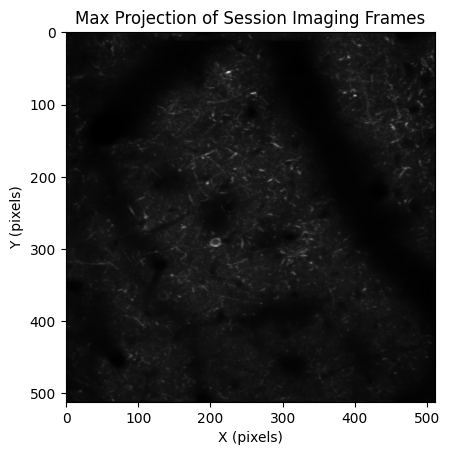

In [ ]:
# Store the max_projection image in a variable and plot using imshow 
max_projection = nwb.processing['plane-0']['images']['max_projection_denoised_plane-0']

plt.imshow(max_projection,
           cmap="gray", 
           origin='upper')

plt.xlabel('X (pixels)') 
plt.ylabel('Y (pixels)')
plt.title('Max Projection of Session Imaging Frames') 

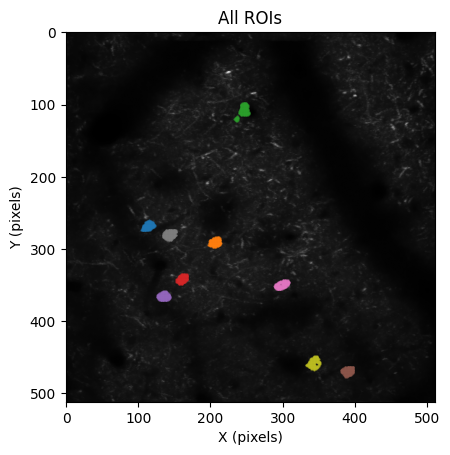

In [77]:
# Plot max projection with pixel masks for each valid soma overlaid 

plt.imshow(max_projection, cmap='gray', origin='upper', aspect='equal')

for pm in roi_table.pixel_mask[:]:
    plt.scatter(pm['x'], pm['y'], s=0.5, alpha=0.5)

plt.title('All ROIs')
plt.xlabel('X (pixels)') 
plt.ylabel('Y (pixels)')
plt.show()

# Note - is this the correct projection image to show? Am I plotting ROIs correctly.... I don't really see all the ROIs in the image 

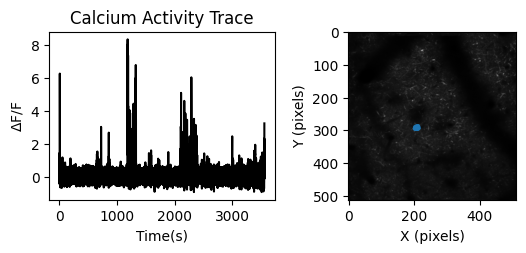

In [78]:
# Select an ROI and plot the calcium activity and the pixel mask overlaid with the max projection image. 

ROI = 1

plt.subplot(2, 2, 1)
plt.plot(ts, dff[:, ROI], 
         label=f'ROI {ROI}', 
         color='black')
plt.ylabel(r'$\Delta$F/F')
plt.xlabel('Time(s)')
plt.title('Calcium Activity Trace')

plt.subplot(2, 2, 2) 
plt.imshow(max_projection, cmap='gray', origin='upper', aspect='equal')

pm = roi_table.pixel_mask[ROI]
plt.scatter(pm['x'], pm['y'], s=0.5, alpha=0.5)
plt.xlabel('X (pixels)') 
plt.ylabel('Y (pixels)')
plt.show()


In [79]:
# Pause here to document information, code snippets, figures (?) in the README 

In [80]:
# Behavior data is also stored in the processing container 

nwb.processing['behavior']

# Running speed as an array with a corresponding timestamps array and eye tracking as a table 

behavior pynwb.base.ProcessingModule at 0x139789124718032
Fields:
  data_interfaces: {
    eye_tracking <class 'hdmf.common.table.DynamicTable'>,
    running_speed <class 'pynwb.base.TimeSeries'>
  }
  description: processed behavioral data

In [81]:
# Store the behavior data 

running_speed = nwb.processing['behavior']['running_speed'].data[:]
running_ts = nwb.processing['behavior']['running_speed'].timestamps[:]
eye_tracking_table = nwb.processing['behavior']['eye_tracking'].to_dataframe()


In [82]:
# Inspect the data structure 

print(np.shape(running_speed))
print(np.shape(running_ts))

# As a sanity check, these are the same length which is good. 
# Question - can we find the collection rate? 

(209040,)
(209040,)


Text(0.5, 0, 'Time (s)')

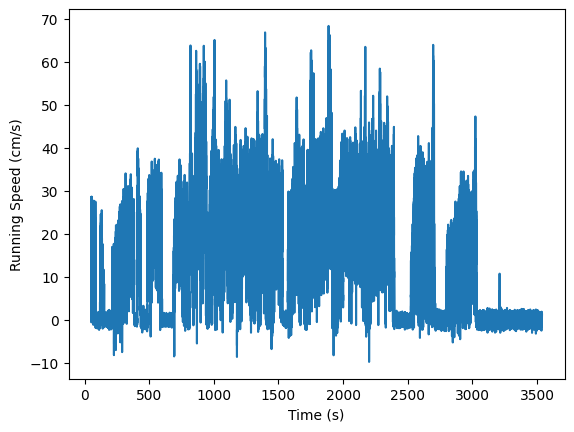

In [83]:
plt.plot(running_ts, running_speed)
plt.ylabel('Running Speed (cm/s)')
plt.xlabel('Time (s)') # units is found in the metadata within the nwb file 

# Sanity check: Different collection rate, but same time range as the neural activity data 

In [ ]:
eye_tracking_table

# table structure here as there are many eye tracking features stored 
# Sanity check: last timestamp ends in ~3500s, so this spans the same time range as neural activity and running data. 

,timestamps,cr_area,eye_area,pupil_area,likely_blink,cr_center_x,cr_center_y,cr_width,cr_height,cr_phi,eye_center_x,eye_center_y,eye_width,eye_height,eye_phi,pupil_center_x,pupil_center_y,pupil_width,pupil_height,pupil_phi
id,,,,,,,,,,,,,,,,,,,,
0,0.27302,NaN,NaN,NaN,True,2.814885,4.214959,0.080830,0.076386,1.767222,2.709429,4.466047,NaN,NaN,NaN,2.703789,4.184357,NaN,NaN,NaN
1,0.28849,NaN,NaN,NaN,True,2.822654,4.208316,0.075138,0.071399,1.606827,2.706202,4.446485,NaN,NaN,NaN,2.700774,4.170526,NaN,NaN,NaN
2,0.30324,NaN,NaN,NaN,True,2.834129,4.204885,0.077584,0.072938,0.685785,2.720766,4.454793,NaN,NaN,NaN,2.712850,4.176998,NaN,NaN,NaN
3,0.33603,NaN,NaN,NaN,True,2.841919,4.192760,0.078523,0.065596,0.860045,2.723926,4.422118,NaN,NaN,NaN,2.722756,4.162602,NaN,NaN,NaN
4,0.36925,NaN,NaN,NaN,True,253.396179,373.444000,7.192110,5.902160,93.575150,243.054474,393.775024,NaN,NaN,NaN,243.501099,370.595215,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106458,3553.95372,NaN,NaN,NaN,True,253.570389,383.835022,3.120411,2.551738,29.728195,252.119965,391.527374,NaN,NaN,NaN,234.412689,392.617645,NaN,NaN,NaN
106459,3553.98679,NaN,NaN,NaN,True,253.710693,383.550232,2.726965,2.585659,56.856308,250.229797,397.848541,NaN,NaN,NaN,234.106857,392.562103,NaN,NaN,NaN
106460,3554.02683,22.151369,41114.937500,4056.955566,False,253.710693,383.550232,2.726965,2.585659,56.856308,250.155121,398.320984,166.081604,78.800369,173.666473,234.108337,392.581421,35.935623,31.926739,170.276276


In [ ]:
eye_tracking_table.shape

# assume this is frames x features 

(106463, 20)

Text(0.5, 0, 'Time (s)')

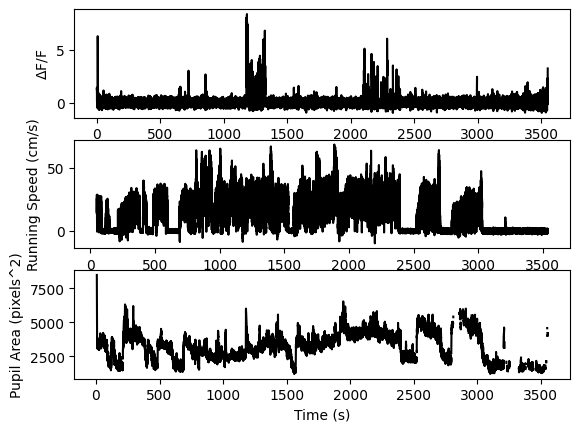

In [85]:
# Plot neural activity relative to running speed and eye tracking data (which column is best to plot?)

plt.subplot(3, 1, 1)
plt.plot(ts, dff[:, ROI], label=f'ROI {ROI}', color='black')
plt.ylabel(r'$\Delta$F/F')

plt.subplot(3,1,2) 
plt.plot(running_ts, running_speed, label='Running Speed', color='black')
plt.ylabel('Running Speed (cm/s)')

plt.subplot(3,1,3)
plt.plot(eye_tracking_table.timestamps, eye_tracking_table['pupil_area'], label='Pupil Area', color='black')
plt.ylabel('Pupil Area (pixels^2)') # NWB file metadata indicates units are in pixels 
plt.xlabel('Time (s)') 


In [86]:
# Pause here - discuss plot, what should we document in the README? 

In [ ]:
# Epoch and stimulus information is stored in the intervals container 

nwb.intervals

{'epochs': epochs pynwb.epoch.TimeIntervals at 0x139789126243376
 Fields:
   colnames: ['stim_name' 'start_time' 'stop_time' 'duration']
   columns: (
     stim_name <class 'hdmf.common.table.VectorData'>,
     start_time <class 'hdmf.common.table.VectorData'>,
     stop_time <class 'hdmf.common.table.VectorData'>,
     duration <class 'hdmf.common.table.VectorData'>
   )
   description: Start and stop times for all stimulus epochs
   id: id <class 'hdmf.common.table.ElementIdentifiers'>,
 'stimulus_table': stimulus_table pynwb.epoch.TimeIntervals at 0x139789351068512
 Fields:
   colnames: ['stim_name' 'start_time' 'stop_time' 'temporal_frequency'
  'spatial_frequency' 'center_azimuth' 'center_elevation' 'direction'
  'frame' 'image_order' 'image_index' 'stimulus_condition_id']
   columns: (
     stim_name <class 'hdmf.common.table.VectorData'>,
     start_time <class 'hdmf.common.table.VectorData'>,
     stop_time <class 'hdmf.common.table.VectorData'>,
     temporal_frequency <class 'hdmf.common.table.VectorData'>,
     spatial_frequency <class 'hdmf.common.table.VectorData'>,
     center_azimuth <class 'hdmf.common.table.VectorData'>,
     center_elevation <class 'hdmf.common.table.VectorData'>,
     direction <class 'hdmf.common.table.VectorData'>,
     frame <class 'hdmf.common.table.VectorData'>,
     image_order <class 'hdmf.common.table.VectorData'>,
     image_index <class 'hdmf.common.table.VectorData'>,
     stimulus_condition_id <class 'hdmf.common.table.VectorData'>
   )
   description: Trial times & parameters all stimulus
   id: id <class 'hdmf.common.table.ElementIdentifiers'>}

In [ ]:
# Epochs table 
epochs = nwb.intervals['epochs'].to_dataframe()
epochs 

# each epoch corresponds to a different stimulus or experiment condition 

,stim_name,start_time,stop_time,duration
id,,,,
0,drifting_gratings_full,52.851639,340.074066,287.222412
1,drifting_gratings_windowed,343.093262,630.315857,287.222595
2,locally_sparse_noise,633.335022,873.551819,240.216797
3,spontaneous,874.536011,1174.769409,300.233398
4,natural_images_12,1177.788696,1329.898682,152.109985
5,natural_movie,1341.925293,1792.283813,450.358521
6,locally_sparse_noise,1796.337280,2096.453857,300.116577
7,natural_images,2098.555664,2397.721436,299.165771
8,drifting_gratings_windowed,2412.817383,2700.039795,287.222412


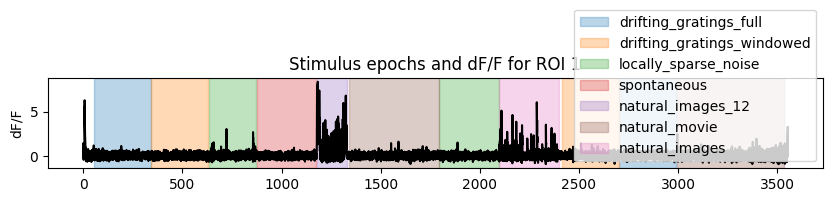

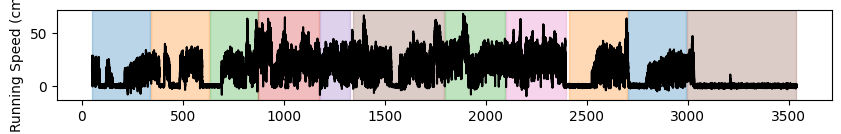

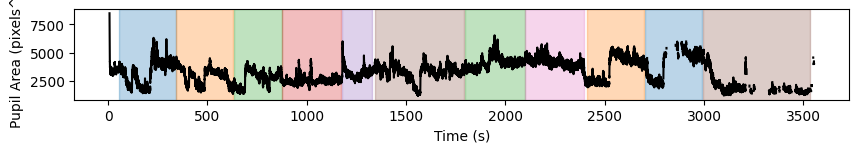

In [ ]:
# Plot epochs overlaid with data timeseries plots 

# to do - place legend in a good place 

# Get unique stimulus names and assign colors for plotting 
names = epochs.stim_name.unique()
colors = dict(zip(names, plt.cm.tab10.colors))

plt.figure(figsize = ([10, 4]))
plt.subplot(3,1,2) 
plt.plot(ts, dff[:, ROI], color='black') # plot neural activity trace 
for name in names:
    stim = epochs[epochs.stim_name == name]        # all epochs with this name

    for i, (start, stop) in enumerate(zip(stim.start_time, stim.stop_time)):
        plt.axvspan(start, stop,
                    color=colors[name],
                    alpha=0.3,
                    label=name if i == 0 else None)     # label only the first

plt.ylabel('dF/F')
plt.title(f'Stimulus epochs and dF/F for ROI {ROI}')
plt.legend()

plt.figure(figsize = ([10, 4]))
plt.subplot(3,1,2) 
plt.plot(running_ts, running_speed, label='Running Speed', color='black')
plt.ylabel('Running Speed (cm/s)')

for name in names:
    stim = epochs[epochs.stim_name == name]        # all epochs with this name

    for i, (start, stop) in enumerate(zip(stim.start_time, stim.stop_time)):
        plt.axvspan(start, stop,
                    color=colors[name],
                    alpha=0.3,
                    label=name if i == 0 else None)     # label only the first


plt.figure(figsize = ([10, 4]))
plt.subplot(3,1,3)
plt.plot(eye_tracking_table.timestamps, eye_tracking_table['pupil_area'], label='Pupil Area', color='black')
plt.ylabel('Pupil Area (pixels^2)') # NWB file metadata indicates units are in pixels 
plt.xlabel('Time (s)') 

for name in names:
    stim = epochs[epochs.stim_name == name]        # all epochs with this name

    for i, (start, stop) in enumerate(zip(stim.start_time, stim.stop_time)):
        plt.axvspan(start, stop,
                    color=colors[name],
                    alpha=0.3,
                    label=name if i == 0 else None)     # label only the first



# questions - what is natural_images_12? look up in data book 

In [ ]:
# Stimulus table contains more detailed information about the stimulus conditions 
stimulus_table = nwb.intervals['stimulus_table'].to_dataframe()

stimulus_table

# what are some useful features to call out here from the table? 
# each row is a stimulus presentation, with start and stop times, stimulus name, and other features 
# this spans across epochs 

,stim_name,start_time,stop_time,temporal_frequency,spatial_frequency,center_azimuth,center_elevation,direction,frame,image_order,image_index,stimulus_condition_id
id,,,,,,,,,,,,
0,drifting_gratings_full,52.851639,54.836639,1.0,0.08,0.0,0.0,300.0,NaN,NaN,NaN,22
1,drifting_gratings_full,55.854118,57.839161,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,24
2,drifting_gratings_full,58.856628,60.841621,1.0,0.04,0.0,0.0,300.0,NaN,NaN,NaN,10
3,drifting_gratings_full,61.859138,63.844120,1.0,0.04,0.0,0.0,240.0,NaN,NaN,NaN,8
4,drifting_gratings_full,64.861656,66.846611,1.0,0.08,0.0,0.0,330.0,NaN,NaN,NaN,23
...,...,...,...,...,...,...,...,...,...,...,...,...
33209,natural_movie,3535.585693,3535.602295,NaN,NaN,NaN,NaN,NaN,895.0,NaN,NaN,2668
33210,natural_movie,3535.618896,3535.635742,NaN,NaN,NaN,NaN,NaN,896.0,NaN,NaN,2669
33211,natural_movie,3535.652344,3535.668945,NaN,NaN,NaN,NaN,NaN,897.0,NaN,NaN,2670


In [ ]:
# How many trials of each stimulus type were there? 

stimulus_table.stim_name.value_counts()

# could also use: stimulus_table.groupby('stim_name').size()


stim_name
natural_movie                 29700
locally_sparse_noise           1705
natural_images                  944
natural_images_12               480
drifting_gratings_full          192
drifting_gratings_windowed      192
spontaneous                       1
Name: count, dtype: int64

In [137]:
# How many unique stimuli were presented in each epoch? 

stimulus_table.groupby('stim_name')['stimulus_condition_id'].nunique()

stim_name
drifting_gratings_full          25
drifting_gratings_windowed      25
locally_sparse_noise          1593
natural_images                 118
natural_images_12               12
natural_movie                 3600
spontaneous                      1
Name: stimulus_condition_id, dtype: int64

In [ ]:
# How many times was each stimulus presented? 

stimulus_table.groupby('stim_name')['stimulus_condition_id'].value_counts().plot.barh()

<Axes: ylabel='stim_name,stimulus_condition_id'>

In [ ]:
# Plot the outcome
stimulus_table.groupby('stim_name')['stimulus_condition_id'].value_counts() 



(array([  0.,   0.,   0.,   0.,   0., 118.,   0.,   0.,   0.,   0.]),
 array([7.5, 7.6, 7.7, 7.8, 7.9, 8. , 8.1, 8.2, 8.3, 8.4, 8.5]),
 <BarContainer object of 10 artists>)

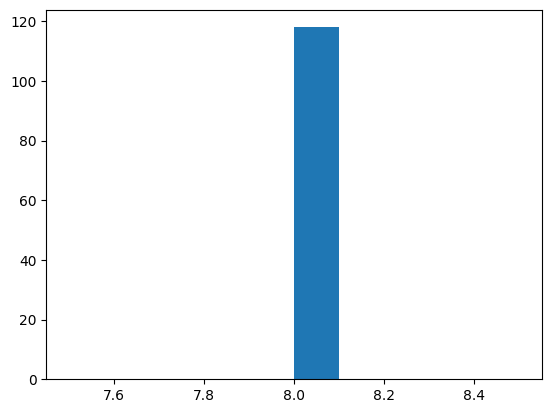

In [ ]:
# Focusing on the natural images epoch, how many times was each stimulus presented? 

# Filter the data and generate as a plot 
plt.hist(stimulus_table[stimulus_table.stim_name == 'natural_images'].stimulus_condition_id.value_counts())

In [94]:
# There are a lot of responses to the natural images 
# We can see (some) of the stimuli presented in the nwb.stimulus container

nwb.stimulus

{'locally_sparse_noise': locally_sparse_noise pynwb.base.Images at 0x139789122746896
 Fields:
   description: Locally sparse noise images
   images: {
     0 <class 'pynwb.image.GrayscaleImage'>,
     1 <class 'pynwb.image.GrayscaleImage'>,
     10 <class 'pynwb.image.GrayscaleImage'>,
     100 <class 'pynwb.image.GrayscaleImage'>,
     1000 <class 'pynwb.image.GrayscaleImage'>,
     1001 <class 'pynwb.image.GrayscaleImage'>,
     1002 <class 'pynwb.image.GrayscaleImage'>,
     1003 <class 'pynwb.image.GrayscaleImage'>,
     1004 <class 'pynwb.image.GrayscaleImage'>,
     1005 <class 'pynwb.image.GrayscaleImage'>,
     1006 <class 'pynwb.image.GrayscaleImage'>,
     1007 <class 'pynwb.image.GrayscaleImage'>,
     1008 <class 'pynwb.image.GrayscaleImage'>,
     1009 <class 'pynwb.image.GrayscaleImage'>,
     101 <class 'pynwb.image.GrayscaleImage'>,
     1010 <class 'pynwb.image.GrayscaleImage'>,
     1011 <class 'pynwb.image.GrayscaleImage'>,
     1012 <class 'pynwb.image.GrayscaleImage'>,
     1013 <class 'pynwb.image.GrayscaleImage'>,
     1014 <class 'pynwb.image.GrayscaleImage'>,
     1015 <class 'pynwb.image.GrayscaleImage'>,
     1016 <class 'pynwb.image.GrayscaleImage'>,
     1017 <class 'pynwb.image.GrayscaleImage'>,
     1018 <class 'pynwb.image.GrayscaleImage'>,
     1019 <class 'pynwb.image.GrayscaleImage'>,
     102 <class 'pynwb.image.GrayscaleImage'>,
     1020 <class 'pynwb.image.GrayscaleImage'>,
     1021 <class 'pynwb.image.GrayscaleImage'>,
     1022 <class 'pynwb.image.GrayscaleImage'>,
     1023 <class 'pynwb.image.GrayscaleImage'>,
     1024 <class 'pynwb.image.GrayscaleImage'>,
     1025 <class 'pynwb.image.GrayscaleImage'>,
     1026 <class 'pynwb.image.GrayscaleImage'>,
     1027 <class 'pynwb.image.GrayscaleImage'>,
     1028 <class 'pynwb.image.GrayscaleImage'>,
     1029 <class 'pynwb.image.GrayscaleImage'>,
     103 <class 'pynwb.image.GrayscaleImage'>,
     1030 <class 'pynwb.image.GrayscaleImage'>,
     1031 <class 'pynwb.image.GrayscaleImage'>,
     1032 <class 'pynwb.image.GrayscaleImage'>,
     1033 <class 'pynwb.image.GrayscaleImage'>,
     1034 <class 'pynwb.image.GrayscaleImage'>,
     1035 <class 'pynwb.image.GrayscaleImage'>,
     1036 <class 'pynwb.image.GrayscaleImage'>,
     1037 <class 'pynwb.image.GrayscaleImage'>,
     1038 <class 'pynwb.image.GrayscaleImage'>,
     1039 <class 'pynwb.image.GrayscaleImage'>,
     104 <class 'pynwb.image.GrayscaleImage'>,
     1040 <class 'pynwb.image.GrayscaleImage'>,
     1041 <class 'pynwb.image.GrayscaleImage'>,
     1042 <class 'pynwb.image.GrayscaleImage'>,
     1043 <class 'pynwb.image.GrayscaleImage'>,
     1044 <class 'pynwb.image.GrayscaleImage'>,
     1045 <class 'pynwb.image.GrayscaleImage'>,
     1046 <class 'pynwb.image.GrayscaleImage'>,
     1047 <class 'pynwb.image.GrayscaleImage'>,
     1048 <class 'pynwb.image.GrayscaleImage'>,
     1049 <class 'pynwb.image.GrayscaleImage'>,
     105 <class 'pynwb.image.GrayscaleImage'>,
     1050 <class 'pynwb.image.GrayscaleImage'>,
     1051 <class 'pynwb.image.GrayscaleImage'>,
     1052 <class 'pynwb.image.GrayscaleImage'>,
     1053 <class 'pynwb.image.GrayscaleImage'>,
     1054 <class 'pynwb.image.GrayscaleImage'>,
     1055 <class 'pynwb.image.GrayscaleImage'>,
     1056 <class 'pynwb.image.GrayscaleImage'>,
     1057 <class 'pynwb.image.GrayscaleImage'>,
     1058 <class 'pynwb.image.GrayscaleImage'>,
     1059 <class 'pynwb.image.GrayscaleImage'>,
     106 <class 'pynwb.image.GrayscaleImage'>,
     1060 <class 'pynwb.image.GrayscaleImage'>,
     1061 <class 'pynwb.image.GrayscaleImage'>,
     1062 <class 'pynwb.image.GrayscaleImage'>,
     1063 <class 'pynwb.image.GrayscaleImage'>,
     1064 <class 'pynwb.image.GrayscaleImage'>,
     1065 <class 'pynwb.image.GrayscaleImage'>,
     1066 <class 'pynwb.image.GrayscaleImage'>,
     1067 <class 'pynwb.image.GrayscaleImage'>,
     1068 <class 'pynwb.image.GrayscaleImage'>,
     1069 <class 'pynwb.image.GrayscaleImage'>,
     107 <class 'pynwb.i

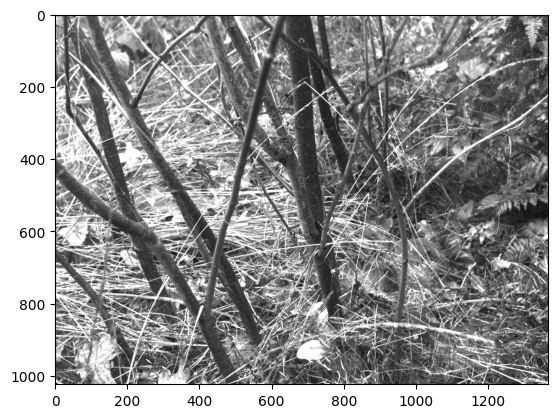

In [95]:
# Question - does the stimulus_condition_id relate to the numbers in the nwb.stimulus? seems like no.... but is there another way to relate? 
plt.imshow(nwb.stimulus['natural_images']['10'], cmap = 'gray')

In [96]:
stimulus_table[stimulus_table.stimulus_condition_id == 1768].head()

,stim_name,start_time,stop_time,temporal_frequency,spatial_frequency,center_azimuth,center_elevation,direction,frame,image_order,image_index,stimulus_condition_id
id,,,,,,,,,,,,
951,natural_images_12,1177.788696,1178.088867,NaN,NaN,NaN,NaN,NaN,NaN,0.0,29.0,1768
963,natural_images_12,1181.591797,1181.891968,NaN,NaN,NaN,NaN,NaN,NaN,0.0,29.0,1768
975,natural_images_12,1185.394897,1185.695190,NaN,NaN,NaN,NaN,NaN,NaN,0.0,29.0,1768
987,natural_images_12,1189.198120,1189.498291,NaN,NaN,NaN,NaN,NaN,NaN,0.0,29.0,1768
999,natural_images_12,1193.001343,1193.301636,NaN,NaN,NaN,NaN,NaN,NaN,0.0,29.0,1768


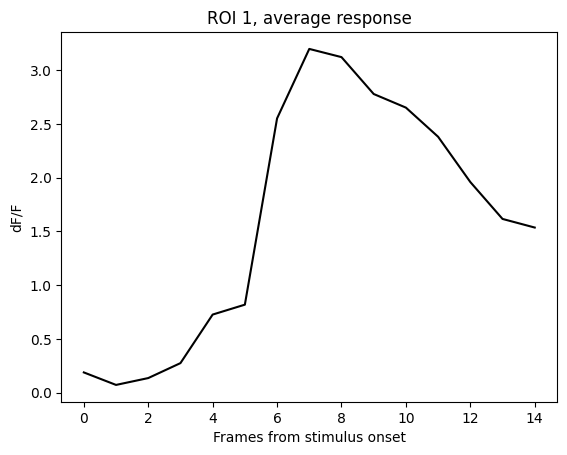

In [97]:
# Plot neural activity response to stimulus presentation 1768 (+ 15 frames) 
n_frames = 15
ROI = 1
stimulus_id = 1768
trace = np.asarray(dff[:, ROI])
stim_start = stimulus_table[stimulus_table.stimulus_condition_id == stimulus_id].start_time.values

stim_dff = []
for start in stim_start:
    i = np.searchsorted(ts, start)          # time → frame index
    stim_dff.append(trace[i : i + n_frames])

stim_dff = np.array(stim_dff)
mean = stim_dff.mean(axis=0)

plt.plot(mean, color='black')
plt.xlabel('Frames from stimulus onset')
plt.ylabel('dF/F')
plt.title(f'ROI {ROI}, average response')
plt.show()

In [98]:
# to do - 
# plot all the ROIs responses during the natural images 

# find preferred responses 

In [99]:
# plot in response to running activity and pupil activity 

In [100]:
# go back to readme - is there anything else we want to call out about the dataset? 

# events? 